In [1]:
import matplotlib.pyplot as plt
import matplotlib.image
import rasterio
import rasterio.plot
import rasterio.merge
import rasterio.mask
import geopandas as gpd
import numpy as np
import warnings
import time
import pandas as pd
import os

In [2]:
import functions

This notebook relies on data already in other folders, do avoid increasing the size, those are referenced directly

In [3]:
# getting dirctory
parentDirectory = os.path.abspath(os.path.join(os.getcwd(), os.pardir))

# moving one up
path_daily = os.path.join(parentDirectory, 'Slope steepness from DEM', 'Gauge Data', "Daily-Gauges-UK.shp")
path_hourly = os.path.join(parentDirectory, 'Slope steepness from DEM', 'Gauge Data', "Hourly-Gauges-UK.shp")

#loading
daily_gauges = gpd.read_file(path_daily,crs=4326)
hourly_gauges = gpd.read_file(path_hourly,crs=4326)

#combining and displaying
gauges = hourly_gauges.append(daily_gauges)
gauges.src_id = gauges.src_id.astype(int);
gauges.head(1)

C:\Users\david\AppData\Local\Temp\ipykernel_13292\288226708.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  gauges = hourly_gauges.append(daily_gauges)


,src_id,station_na,station_fi,historic_c,station_la,station_lo,station_el,first_year,last_year,geometry
0,3,FAIR ISLE,fair-isle,shetland,59.526,-1.63,57,1974,2020,POINT (-1.63000 59.52600)


In [4]:
gauges.station_el.max()

408

In [5]:
outline_UK = gpd.read_file("Drainage Basins Data/Outline UK/gadm36_GBR_0.shp",crs=4326)
outline_UK_untouched = gpd.read_file("Drainage Basins Data/Outline UK/gadm36_GBR_0.shp",crs=4326)
outline_UK.iloc[0].geometry

#### All the basin data for europe is quite large
sorting in QGIS is easier using the 'select within' tool<br>
though could also be done in python hypothetically
###### best not to run these cells but import it in cell 12, saves quite the time

In [6]:
run = False
if run:
    basins = gpd.read_file("Drainage Basins Data/eu_bas_15s_beta.shp",crs=4326)
    # 390120 rows × 3 columns
    basins_UK = gpd.sjoin(basins, outline_UK, how='inner', predicate='within')

Plotting takes long so here's a saved picture:

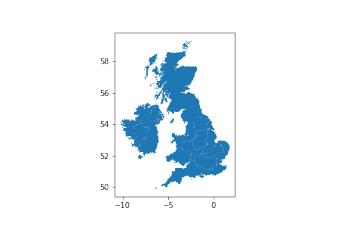

In [7]:
# basins_UK.plot()
# plt.savefig("Figures/Part_UK.png")
plt.imshow(matplotlib.image.imread("Figures/Part_UK.png"))
plt.axis("off");

We're missing some, lets simplyfiy the shape and run again

<AxesSubplot:>

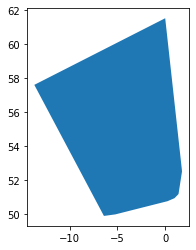

In [8]:
outline_UK.geometry = outline_UK.geometry.convex_hull
outline_UK.plot()

In [9]:
if run:
    basins = gpd.read_file("Drainage Basins Data/eu_bas_15s_beta.shp",crs=4326)
    basins_UK = gpd.sjoin(basins, outline_UK, how='inner', predicate='within')
    basins_UK

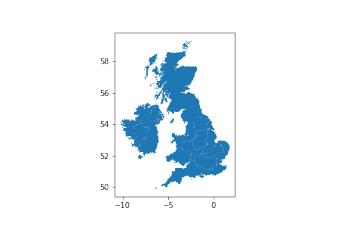

In [10]:
# basins_UK.plot()
# plt.savefig("Figures/Whole_UK.jpg")
plt.imshow(matplotlib.image.imread("Figures/Whole_UK.png"))
plt.axis("off");

In [11]:
if run:
    basins_UK.to_file('Basins UK filtered')

#### Do the same for rivers:

We also want information on the rivers:

In [12]:
if run:
    path_rivers = os.path.join(parentDirectory, \
                               'Drainage Basins', 'Drainage Basins Data','River Data','eu_riv_15s.shp')

    rivers = gpd.read_file(path_rivers,crs=4326)

We use the simplified outline of the uk to compare to: running a spacial join filters the wanted

In [13]:
if run:
    rivers_UK = gpd.sjoin(rivers, outline_UK, how='inner', predicate='within')

#### Again takes long to run, so lets load it instead


In [14]:
if run:
    rivers_UK
    rivers_UK.to_file("Rivers UK filtered")

#### loading in and removing unwanted info 
_could be done in the sjoin i believe but this works_

In [15]:
rivers_UK = gpd.read_file("Rivers UK filtered\Rivers UK filtered.shp")
rivers_UK = rivers_UK.drop(columns=["index_righ", "GID_0", "NAME_0"])
rivers_UK.reset_index(inplace=True)

### For simplicity and repeatablility load in from here on, dropping the extra columns we dont need


In [16]:
basins_UK = gpd.read_file("Basins UK filtered\Basins UK filtered.shp")
basins_UK = basins_UK.drop(columns=["index_righ", "GID_0", "NAME_0"])

rivers_UK = gpd.read_file("Rivers UK filtered\Rivers UK filtered.shp")
rivers_UK = rivers_UK.drop(columns=["index_righ", "GID_0", "NAME_0"])
rivers_UK.reset_index(inplace=True)

basins_UK.head(3)

,BASIN_ID,AREA_SQKM,geometry
0,2800,0.1,"POLYGON ((-2.40833 59.39167, -2.41250 59.39167..."
1,2801,0.1,"POLYGON ((-2.40417 59.39167, -2.40833 59.39167..."
2,2802,0.1,"POLYGON ((-2.40000 59.39167, -2.40417 59.39167..."


In [17]:
print(len(basins_UK))

61889


1932


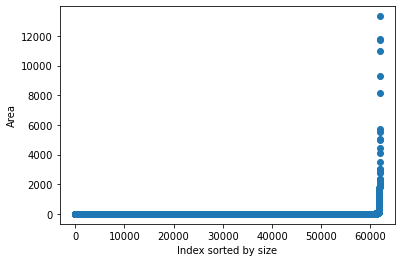

In [18]:
fig, ax = plt.subplots(1)
sorted_size_UK = basins_UK.sort_values('AREA_SQKM',ascending=True).reset_index()
sorted_size_UK.AREA_SQKM.plot(marker="o",ls="",ax=ax)
ax.set_xlabel("Index sorted by size")
ax.set_ylabel("Area")
print(len(basins_UK.query("AREA_SQKM > 5")))

In [19]:
gauges.head(1)

,src_id,station_na,station_fi,historic_c,station_la,station_lo,station_el,first_year,last_year,geometry
0,3,FAIR ISLE,fair-isle,shetland,59.526,-1.63,57,1974,2020,POINT (-1.63000 59.52600)


Now we want to allocate a per gauge, the basin which it corresponds to, this can also be done with an sjoin

In [20]:
gauges = gpd.sjoin(gauges, basins_UK, how='inner', predicate='within')

In [21]:
gauges = gauges.drop(columns=["index_right", "AREA_SQKM"])
gauges.head(3)

,src_id,station_na,station_fi,historic_c,station_la,station_lo,station_el,first_year,last_year,geometry,BASIN_ID
3,23,KIRKWALL,kirkwall,orkney,58.953,-2.901,26,1957,2020,POINT (-2.90100 58.95300),6316
4,32,WICK AIRPORT,wick-airport,caithness,58.454,-3.090,36,1930,2020,POINT (-3.09000 58.45400),12697
5,40,CASSLEY,cassley,sutherland,58.168,-4.727,99,1999,2020,POINT (-4.72700 58.16800),22127


This means we can now look up a gauge and its Basin_ID, see bellow

<AxesSubplot:>

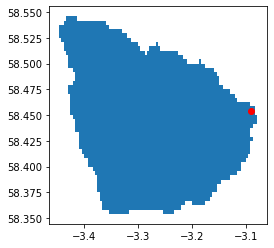

In [22]:
df_row = gauges.iloc[1]
fig, ax = plt.subplots(1)
ax.plot(df_row.station_lo,df_row.station_la, "ro")
basins_UK.query(f'BASIN_ID == {df_row["BASIN_ID"]}').plot(ax=ax)

we'll only take the basins which are unique:

In [23]:
unique_ids = gauges.BASIN_ID.unique()
len(unique_ids)

200

In [24]:
basins_UK_filtered = basins_UK[basins_UK.BASIN_ID.isin(unique_ids)]
basins_UK_filtered

,BASIN_ID,AREA_SQKM,geometry
1247,4643,41.7,"POLYGON ((-3.12500 59.06250, -3.13333 59.06250..."
2156,6316,0.6,"POLYGON ((-2.90000 58.94583, -2.90417 58.94583..."
4064,10760,108.2,"POLYGON ((-4.12083 58.39167, -4.10417 58.39167..."
4430,11604,520.8,"POLYGON ((-4.38750 58.17500, -4.39583 58.17500..."
4793,12697,298.9,"POLYGON ((-3.23750 58.35417, -3.25417 58.35417..."
...,...,...,...
60522,140303,275.2,"POLYGON ((-4.63750 50.32500, -4.64167 50.32500..."
60763,140557,14.7,"POLYGON ((-3.64583 50.27917, -3.65833 50.27917..."
60904,140730,57.7,"POLYGON ((-5.27083 50.17083, -5.28750 50.17083..."
61452,141413,5.6,"MULTIPOLYGON (((-5.29167 50.07083, -5.29167 50..."


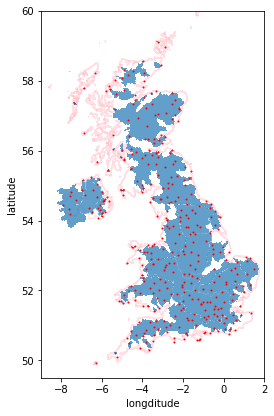

In [25]:
fig, ax = plt.subplots(1,figsize=(4,7))
outline_UK_untouched.plot(ax=ax,alpha=0.5,color="none",edgecolor='pink')
basins_UK_filtered.plot(ax=ax, alpha=0.7)
gauges.plot(color="red",ax=ax,markersize=1)
ax.set_xlim((-9,2))
ax.set_ylim((49.5,60))
ax.set_xlabel("longditude")
ax.set_ylabel("latitude")
ax.figure.savefig("Figures/Filtered_UK.jpg")

In [26]:
len(basins_UK_filtered)

200

Quite a few small basins:

Text(0, 0.5, 'Area')

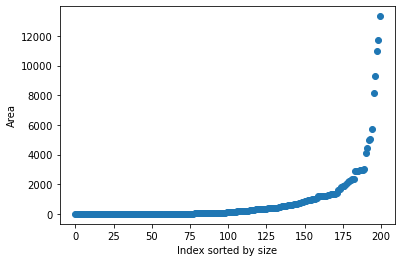

In [27]:
fig, ax = plt.subplots(1)
sorted_size = basins_UK_filtered.sort_values('AREA_SQKM',ascending=True).reset_index()
sorted_size.AREA_SQKM.plot(marker="o",ls="",ax=ax)
ax.set_xlabel("Index sorted by size")
ax.set_ylabel("Area")

In [28]:
basins_UK_filtered.reset_index(inplace=True,drop=True)
basins_UK_filtered.head(2)

,BASIN_ID,AREA_SQKM,geometry
0,4643,41.7,"POLYGON ((-3.12500 59.06250, -3.13333 59.06250..."
1,6316,0.6,"POLYGON ((-2.90000 58.94583, -2.90417 58.94583..."


In [29]:
gauges.head(1)

,src_id,station_na,station_fi,historic_c,station_la,station_lo,station_el,first_year,last_year,geometry,BASIN_ID
3,23,KIRKWALL,kirkwall,orkney,58.953,-2.901,26,1957,2020,POINT (-2.90100 58.95300),6316


#### To crop a given area around the gauge, we also want the raster_id
This can be loaded in from "circels with raster_id.csv" from "slope steepness from DEM":<br>
Alternatively the same code can be run as there "find_raster(df, UK_data_bounds)"<br>
But as the data is availible it will be reused

In [30]:
parentDirectory = os.path.abspath(os.path.join(os.getcwd(), os.pardir))
csv_id = os.path.join(parentDirectory, 'Slope steepness from DEM', 'circels with raster_id.csv')
raster_ids = pd.read_csv(csv_id,usecols=[1,11])
raster_ids.src_id = raster_ids.src_id.astype(int)
gauges = gauges.merge(raster_ids, on ="src_id")

In [31]:
gauges.head(1)

,src_id,station_na,station_fi,historic_c,station_la,station_lo,station_el,first_year,last_year,geometry,BASIN_ID,raster_id
0,23,KIRKWALL,kirkwall,orkney,58.953,-2.901,26,1957,2020,POINT (-2.90100 58.95300),6316,4


In [32]:
UK = []
UK_dir = os.path.join(parentDirectory, 'Slope steepness from DEM','DEM Data', 'filenames-UK.txt')
with open(UK_dir) as fin:
    for line in fin:
        UK.append(str(line.strip()))
UK[0]

'n50e000_dem'

Check that it works:

In [33]:
filepath = UK[0]
path = os.path.join(parentDirectory, 'Slope steepness from DEM', 'DEM Data', filepath, filepath,"w001001.adf")
with rasterio.open(path) as src:
    out = src.read(1)
print(out)

[[-32768 -32768 -32768 ... -32768 -32768 -32768]
 [-32768 -32768 -32768 ... -32768 -32768 -32768]
 [-32768 -32768 -32768 ... -32768 -32768 -32768]
 ...
 [-32768 -32768 -32768 ...    440    441    443]
 [-32768 -32768 -32768 ...    439    439    439]
 [-32768 -32768 -32768 ...    436    433    434]]


In [34]:
gauges.head(3)

,src_id,station_na,station_fi,historic_c,station_la,station_lo,station_el,first_year,last_year,geometry,BASIN_ID,raster_id
0,23,KIRKWALL,kirkwall,orkney,58.953,-2.901,26,1957,2020,POINT (-2.90100 58.95300),6316,4
1,32,WICK AIRPORT,wick-airport,caithness,58.454,-3.090,36,1930,2020,POINT (-3.09000 58.45400),12697,4
2,40,CASSLEY,cassley,sutherland,58.168,-4.727,99,1999,2020,POINT (-4.72700 58.16800),22127,4


#### This can then be run for all the cells:
This was already done to save time<br>
Note a difference in name used: "Cropped Data/Watershed-{self.lst_UK[raster_id_n]} - {n}.adf"

In [35]:
run = False
if run:
    for i in range(len(gauges)):
        functions.Location_In_Basin(gauges, UK, 5, basins_UK_filtered,rivers_UK).crop_raster_watershed(i)

The Raster can then be plotted:

<AxesSubplot:title={'center':'Surroundings of braemar-no-2 at (-3.397,57.011)'}>

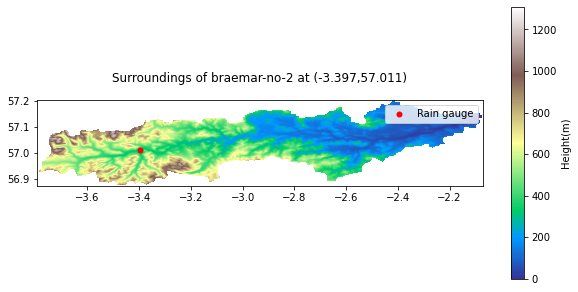

In [36]:
i = 20
functions.plotting_watersheds(gauges, UK, 5, basins_UK_filtered,rivers_UK).plot_cropped_raster(i)

In [37]:
array, index = functions.Location_In_Basin(gauges, UK, 5, basins_UK_filtered,rivers_UK).get_array_given_orientation(i,"ew")

The main issue is, it's no longer centered as before, diagonals will therefore not really work well. <br>
East-west and north-south will work well 

<AxesSubplot:title={'center':'Surroundings of braemar-no-2 at (-3.397,57.011)'}>

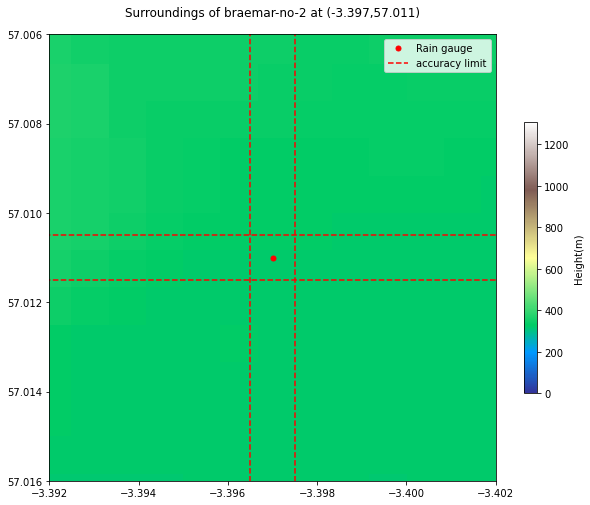

In [38]:
functions.plotting_watersheds(gauges, UK, 5, basins_UK_filtered,rivers_UK).plot_cropped_raster(i,zoom_in=True)

In [39]:
height = functions.Location_In_Basin(gauges, UK, 5, basins_UK_filtered,rivers_UK).run_get_raster_pixel(i)
### interesting, comparing it to the colorbar seems promising
height

324

#### Continueing with rivers:

Quite a detailed database of rivers

11253

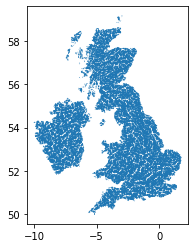

In [40]:
rivers_UK.plot()
len(rivers_UK)

given we have a basin:

In [41]:
i = 2
basin = functions.Location_In_Basin(gauges, UK, 5, basins_UK_filtered, rivers_UK).get_watershed(i)
basin

,BASIN_ID,AREA_SQKM,geometry
11,22127,1260.7,"POLYGON ((-4.88333 57.83750, -4.88333 57.84167..."


we can then do the same sjoin:

In [42]:
river_in_given_basin = gpd.sjoin(rivers_UK, basin, how='inner', predicate='within')

This can then be plotted to reveal a very similar looking picture

<AxesSubplot:>

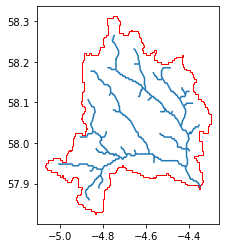

In [43]:
fig, ax = plt.subplots(1)
river_in_given_basin.plot(ax=ax)
basin.plot(ax=ax,color="none",edgecolor="red")


These two can then be combined

<AxesSubplot:title={'center':'Surroundings of cassley at (-4.727,58.168)'}>

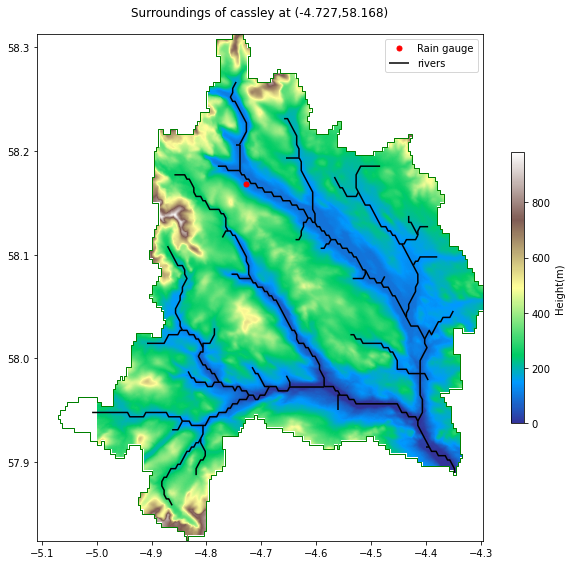

In [44]:
functions.plotting_watersheds(gauges, UK, 5, basins_UK_filtered, rivers_UK).plot_cropped_raster(i, rivers=True)

Some gauges have no rivers near them:

<AxesSubplot:title={'center':'Surroundings of kirkwall at (-2.901,58.953)'}>

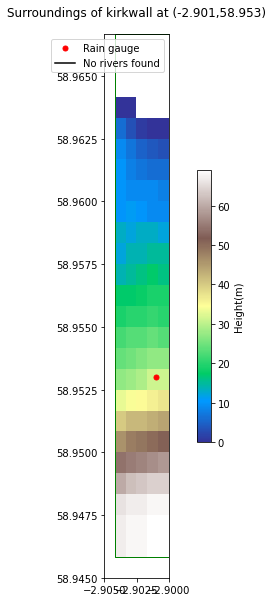

In [45]:
i = 0
functions.plotting_watersheds(gauges, UK, 5, basins_UK_filtered, rivers_UK).plot_cropped_raster(i, rivers=True)

Get an idea which watersheds drain directly to the sea as they are coastal and which don't:

In [46]:
gauges.reset_index(inplace=True)
gauges.reset_index(inplace=True)
gauges.drop(columns="index",inplace=True)
gauges

,level_0,src_id,station_na,station_fi,historic_c,station_la,station_lo,station_el,first_year,last_year,geometry,BASIN_ID,raster_id
0,0,23,KIRKWALL,kirkwall,orkney,58.953,-2.901,26,1957,2020,POINT (-2.90100 58.95300),6316,4
1,1,32,WICK AIRPORT,wick-airport,caithness,58.454,-3.090,36,1930,2020,POINT (-3.09000 58.45400),12697,4
2,2,40,CASSLEY,cassley,sutherland,58.168,-4.727,99,1999,2020,POINT (-4.72700 58.16800),22127,4
3,3,44,ALTNAHARRA NO 2,altnaharra-no-2,sutherland,58.288,-4.442,81,1993,2020,POINT (-4.44200 58.28800),11604,4
4,4,48,"KINBRACE, HATCHERY",kinbrace-hatchery,sutherland,58.230,-3.922,103,1999,2020,POINT (-3.92200 58.23000),18745,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
359,359,15381,"AUCHTERMUCHTY, ROSSIE",auchtermuchty-rossie,fife,56.299,-3.203,75,1997,2020,POINT (-3.20300 56.29900),52212,4
360,360,7228,"RINGMER, BISHOPS LANE",ringmer-bishops-lane,east-sussex,50.897,0.058,23,2016,2020,POINT (0.05800 50.89700),137672,0
361,361,57118,BUTE: ROTHESAY NO2,bute-rothesay-no2,buteshire,55.825,-5.056,36,2013,2020,POINT (-5.05600 55.82500),62880,5
362,362,57233,MARGAM NO 2,margam-no-2,glamorganshire,51.555,-3.721,40,2013,2020,POINT (-3.72100 51.55500),132058,1


In [47]:
instance = functions.Location_In_Basin(gauges, UK, 5, basins_UK_filtered, rivers_UK)
gauges["rivers_in_watershed_df"] = instance.run_get_rivers_in_watershed()


Those with no rivers can

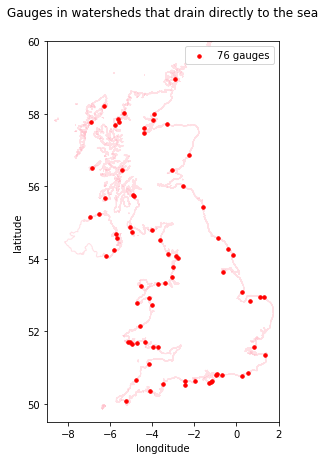

In [48]:
no_rivers = gauges[gauges.rivers_in_watershed_df.isnull()]

fig, ax = plt.subplots(1, figsize=(5,7))

outline_UK_untouched.plot(ax=ax,alpha=0.5,color="none", edgecolor='pink')
no_rivers.plot(ax=ax,color="red",label=f"{len(no_rivers)} gauges", markersize=12)

ax.set_xlim((-9,2))
ax.set_ylim((49.5,60))
ax.set_xlabel("longditude")
ax.set_ylabel("latitude")

title = "Gauges in watersheds that drain directly to the sea"
ax.set_title(title,y=1.05)
ax.figure.savefig(f'Figures/{title}.jpg')
ax.legend();

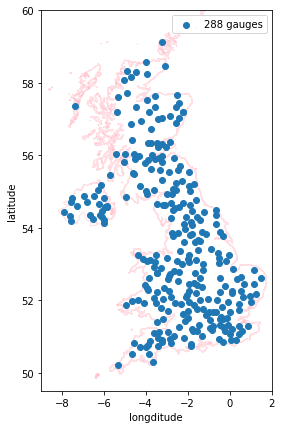

In [49]:
gauges_with_rivers = gauges[~gauges.rivers_in_watershed_df.isnull()]

fig, ax = plt.subplots(1, figsize=(7,7))
outline_UK_untouched.plot(ax=ax,alpha=0.5,color="none", edgecolor='pink')
gauges_with_rivers.plot(ax=ax,label=f'{len(gauges_with_rivers)} gauges')

ax.set_xlim((-9,2))
ax.set_ylim((49.5,60))
ax.set_xlabel("longditude")
ax.set_ylabel("latitude")
ax.legend();

Of those gauges, they are spread over a couple of basins:

In [50]:
len(gauges_with_rivers.BASIN_ID.unique())

123

#### Knowing the basins and rivers, we want to consider the vertical distance to the rivers: i.e. the distance above the closes river point
Let's consider the same case as above, gauge #2
(note we keep using the gauges df to keep indexes constant)

In [51]:
i = 40
#### for the gauge at point:
print(gauges.geometry.iloc[i])
#### This is the given df 
gauges.rivers_in_watershed_df.iloc[i]

POINT (-1.882 55.02)


,index,ARCID,UP_CELLS,geometry,index_right,BASIN_ID,AREA_SQKM
2575,2575,59526,446,"LINESTRING (-2.45417 55.33542, -2.44792 55.335...",71,78770,2878.8
2576,2576,59527,129,"LINESTRING (-2.33958 55.32500, -2.33958 55.314...",71,78770,2878.8
2578,2578,59580,578,"LINESTRING (-2.34792 55.30208, -2.34375 55.29792)",71,78770,2878.8
2582,2582,59645,157,"LINESTRING (-2.38333 55.29375, -2.34792 55.293...",71,78770,2878.8
2599,2599,59871,139,"LINESTRING (-2.54583 55.29167, -2.53125 55.277...",71,78770,2878.8
...,...,...,...,...,...,...,...
3299,3299,66616,941,"LINESTRING (-2.44792 54.78958, -2.44375 54.793...",71,78770,2878.8
3325,3325,66985,106,"LINESTRING (-2.50417 54.76875, -2.49792 54.768...",71,78770,2878.8
3326,3326,66986,431,"LINESTRING (-2.49375 54.76458, -2.48542 54.772...",71,78770,2878.8
3345,3345,67188,427,"LINESTRING (-2.37500 54.75000, -2.38542 54.760...",71,78770,2878.8


In [52]:
### helper code
def distance_one_deg_with_df(df, n):
    """need to find the distance in m one degree, verified here https://www.opendem.info/arc2meters.html"""
    one_arc_second = np.cos(df.station_la.iloc[n] * np.pi / 180) * (1852/60)
    return one_arc_second * 3600

We now have a set of linestring points which are rivers, so we want to find the closest for each, compute that distance and compute the closest. This is similar to the steps taken in "Slope steepness from contours",<br>
resources: linear referencing from [stackoverflow](https://stackoverflow.com/questions/24415806/coordinates-of-the-closest-points-of-two-geometries-in-shapely) and [shapely](https://shapely.readthedocs.io/en/latest/manual.html#linear-referencing-methods)

min= 1423.535m
pos list= 73
closest point= POINT (-1.8854166666668615 54.99791666666597)


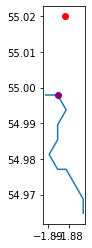

In [53]:
### from contours
#     def distance_to_n_contours(self, index):
#         """
#         Repeats select_closest_contour() but for index of df, returns new df
#         """
#         contours = self.select_closest_contour(index).head(self.selected_n)
#         point = self.df.iloc[index].geometry
#         distance_contour = []
#         for i in range(self.selected_n):
#             line = contours.iloc[i].geometry
#             distance_contour.append(point.distance(line.interpolate(line.project(point)))*self.distance_one_deg(index)
#         return contours

## take the initial point
point = gauges.geometry.iloc[i]

# define the lines 
rivers_in_watershed = gauges.rivers_in_watershed_df.iloc[i]

# blank list to append to
distance_river = []

# loop over all the lines
for j in range(len(rivers_in_watershed)):
    line = rivers_in_watershed.iloc[j].geometry
    distance_river.append(point.distance(line.interpolate(line.project(point)))*distance_one_deg_with_df(gauges,i))
    
print(f'min= {min(distance_river):.3f}m')

pos = distance_river.index(min(distance_river))
print(f'pos list= {pos}')

line = rivers_in_watershed.iloc[pos].geometry
closest_point = line.interpolate(line.project(point))
print(f'closest point= {closest_point}')

# plotting
fig, ax = plt.subplots(1)
rivers_in_watershed.query(f'ARCID == {rivers_in_watershed.iloc[pos].ARCID}').plot(ax=ax)
gauges.query(f'index == {i}').plot(ax=ax,color="red")
ax.plot(closest_point.x,closest_point.y,'o',color="purple")

The steps above can be completed for every watershed

In [54]:
instance = functions.Location_In_Basin(gauges, UK, 5, basins_UK_filtered, rivers_UK)
gauges["closest_point_on_river"] = instance.run_get_closest_point_river()
gauges["distance_closest_point_on_river"] = instance.run_get_closest_point_river(distance=True)

Text(0, 0.5, 'distance(m)')

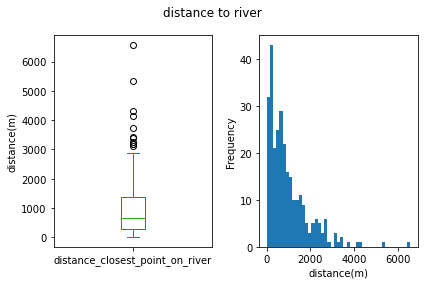

In [55]:
fig, ax = plt.subplots(1,2,tight_layout=True)
title = "distance to river"
fig.suptitle(title)
gauges.distance_closest_point_on_river.plot.box(ax=ax[0])
gauges.distance_closest_point_on_river.plot.hist(ax=ax[1],bins=45)

ax[1].set_xlabel("distance(m)")
ax[0].set_ylabel("distance(m)")

The distance to the river doesn't actually matter than much, the difference in height is more interesting. Take as example the furtherst gauge from a river.

<AxesSubplot:title={'center':'Surroundings of holbeach-no-2 at (0.139,52.873)'}>

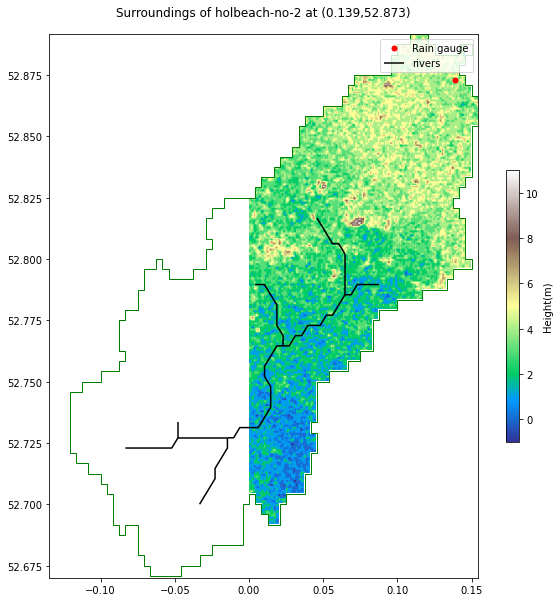

In [56]:
index = gauges.distance_closest_point_on_river.sort_values(ascending=False).index[0]
gauges.query(f'index == {index}')
functions.plotting_watersheds(gauges, UK, 5, basins_UK_filtered, rivers_UK).plot_cropped_raster(index, rivers=True)

We can get the height of a point on the map using the same method used to find the heights before

In [57]:
instance = functions.Location_In_Basin(gauges, UK, 5, basins_UK_filtered, rivers_UK)
gauges["height_closest_point_on_river"] = instance.run_get_height_of_point_river()

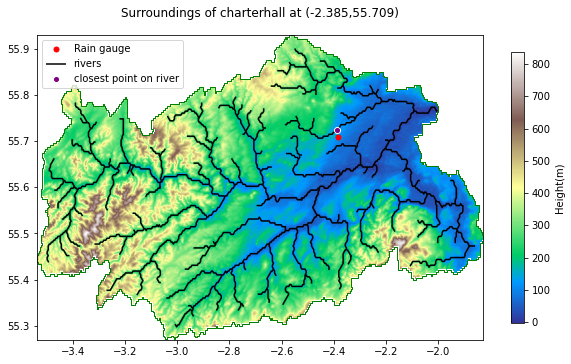

In [58]:
index = 34
functions.plotting_watersheds(gauges, UK, 5, basins_UK_filtered, rivers_UK).plot_cropped_raster(index, rivers=True)
plt.plot(gauges.closest_point_on_river.iloc[index].x,gauges.closest_point_on_river.iloc[index].y,
         'o',color="white",markersize=6)
plt.plot(gauges.closest_point_on_river.iloc[index].x,gauges.closest_point_on_river.iloc[index].y,
         'o',color="purple",markersize =4, label="closest point on river")
plt.legend(loc="upper left")
# plt.savefig("Figures/gauges and closest point on river.jpg")

In [59]:
gauges["diff_closest_point_on_river"] = gauges["station_el"] - gauges['height_closest_point_on_river']

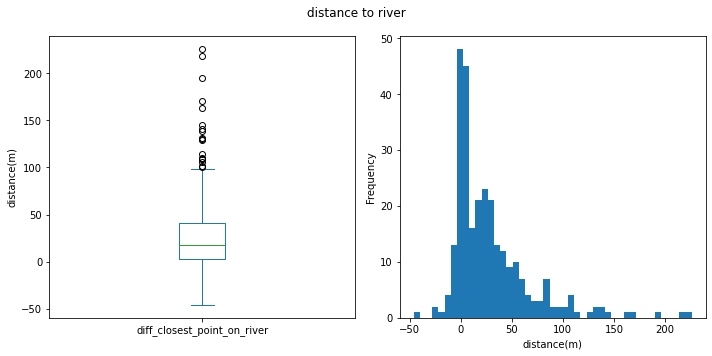

In [60]:
fig, ax = plt.subplots(1,2,tight_layout=True,figsize=(10,5))
title = "distance to river"
fig.suptitle(title)
gauges.diff_closest_point_on_river.plot.box(ax=ax[0])
gauges.diff_closest_point_on_river.plot.hist(ax=ax[1],bins=45)

ax[1].set_xlabel("distance(m)")
ax[0].set_ylabel("distance(m)")
ax[0].figure.savefig(f'Figures/{title}.png')

334


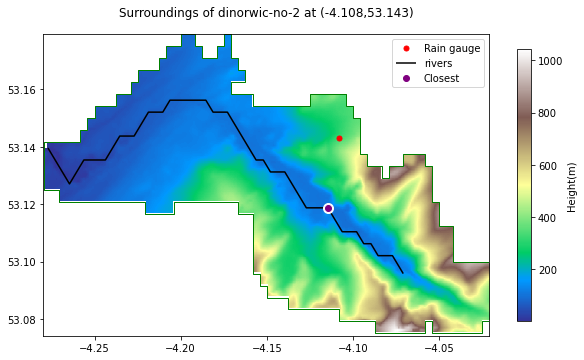

In [61]:
index = gauges.diff_closest_point_on_river.sort_values(ascending=False).index[0]
print(index)
gauges.query(f'index == {index}')
functions.plotting_watersheds(gauges, UK, 5, basins_UK_filtered, rivers_UK).plot_cropped_raster(index, rivers=True)
plt.plot(gauges.closest_point_on_river.iloc[index].x,gauges.closest_point_on_river.iloc[index].y,
         'o',color="white",markersize=10)
plt.plot(gauges.closest_point_on_river.iloc[index].x,gauges.closest_point_on_river.iloc[index].y,
         'o',color="purple",label="Closest")
plt.legend()